<a href="https://colab.research.google.com/github/shitijnigam/colab-repo/blob/main/Stable_Diffusion_Pipeline_v0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install -Uq diffusers transformers fastcore

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.9/70.9 kB 7.0 MB/s eta 0:00:00


In [4]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch

from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)
torch.manual_seed(1)

if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [5]:
# StableDiffusionPipeline.from_pretrained??

In [6]:
# use pre-trained to download pre-trained weights
# fp16 (half precision) version of weights - faster inference
# compvis is the repo ID of the pretrained pipeline

model_name = "CompVis/stable-diffusion-v1-4"
weight_version = "fp16"
pipe = StableDiffusionPipeline.from_pretrained(
    model_name,
    variant = weight_version,
    torch_dtype=torch.float16
    ).to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [7]:
# enable attention slicing; splits input tensors to slices to compute attention in several steps
# useful to save memory; compromises speed

pipe.enable_attention_slicing()

  0%|          | 0/50 [00:00<?, ?it/s]

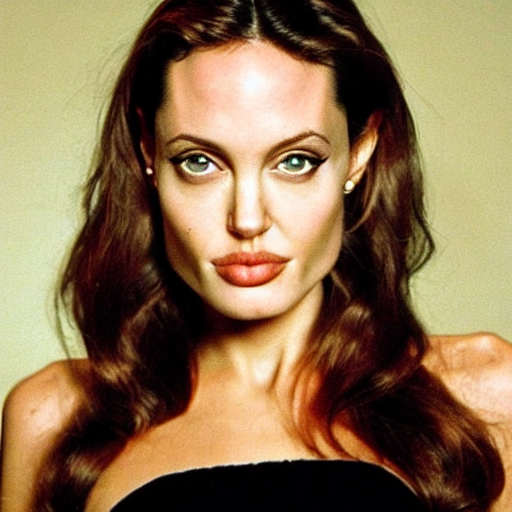

In [34]:
# test prompts :)
prompt = "an actress that looks like a young angelina jolie"
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

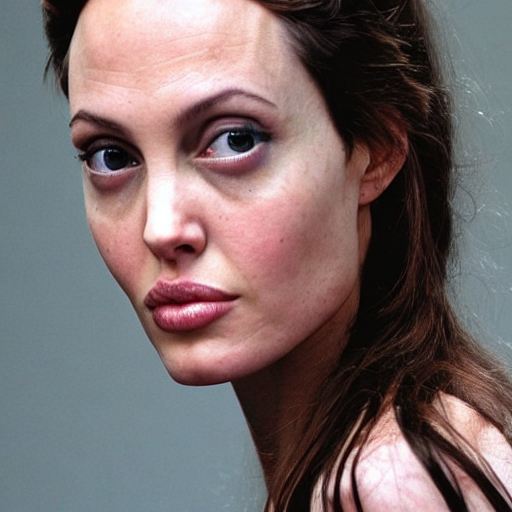

In [35]:
torch.manual_seed(1024)
pipe(prompt).images[0]

  0%|          | 0/5 [00:00<?, ?it/s]

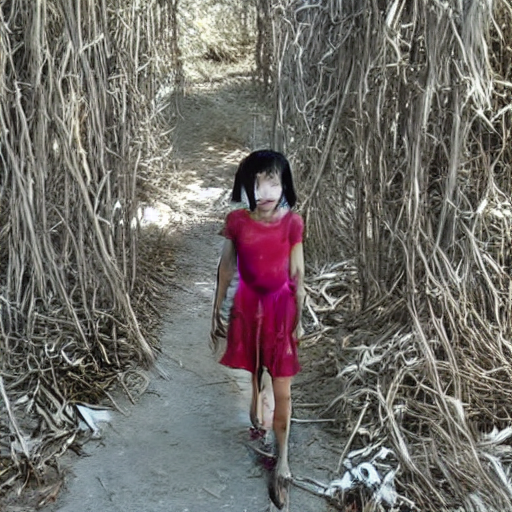

In [36]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps = 5).images[0]

  0%|          | 0/16 [00:00<?, ?it/s]

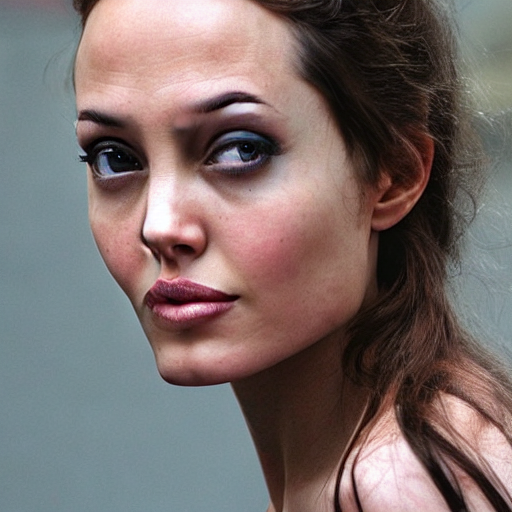

In [37]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps = 16).images[0]

In [38]:
# classifier free guidance
# increase adherence of output to the conditioning signal
# details: https://sander.ai/2022/05/26/guidance.html
# the more the guidance, the better the text prompt is represented, but the less the diversity of output

def image_grid(imgs, rows, cols):
  w, h = imgs[0].size
  grid = Image.new('RGB', size = (cols*w, rows*h))
  for i, img in enumerate(imgs):
    grid.paste(img, box = (i%cols*w, i//cols*h))
  return grid

num_rows, num_cols = 4, 4
prompts = [prompt] * num_cols

images = concat(pipe(prompts, guidance_scale = g).images for g in [1.1, 3, 7, 14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

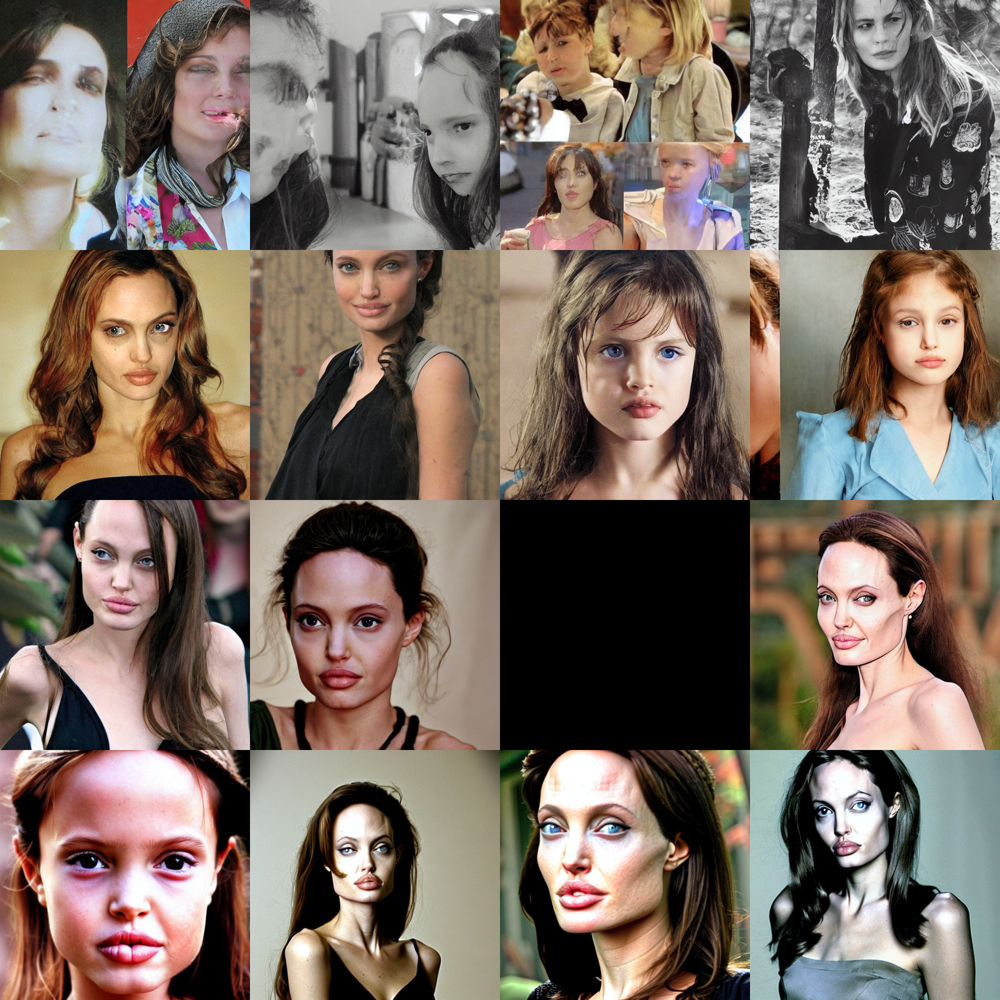

In [39]:
image_grid(images, rows = num_rows, cols = num_cols)